In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from Network import RKMNetwork
import networkx as nx
from scipy.interpolate import make_smoothing_spline
import ast
import matplotlib
from matplotlib import cm
import glob
import matplotlib as mpl

lam=20

In [2]:
plt.rcParams.update({'font.size': 20})

In [3]:
def setup(df):
    df.Vtest = [ast.literal_eval(x) for x in df.Vtest]
    df.Vrecon = [ast.literal_eval(x) for x in df.Vrecon]
    try:
        df.Vtest_det = [ast.literal_eval(x) for x in df.Vtest_det]
        df.Vrecon_det = [ast.literal_eval(x) for x in df.Vrecon_det]
    except:
        pass
#     df.Davals[1:] = [ast.literal_eval(x) for x in df.Davals[1:]]
#     df.Ravals_forward[1:] = [ast.literal_eval(x) for x in df.Ravals_forward[1:]]
#     df.Ravals_back[1:] = [ast.literal_eval(x) for x in df.Ravals_back[1:]]

    MSEs = []
    MSEdet = []

    for trainingstep in df.trainingstep:
        row = df[df.trainingstep == trainingstep].iloc[0]


        Vtest = np.array(row.Vtest).T
        Vrecon = np.array(row.Vrecon).T
        MSE = np.mean(np.linalg.norm(Vtest-Vrecon, axis=0))
        MSEs.append(MSE)
        try:
            Vtest_det = np.array(row.Vtest_det).T
            Vrecon_det = np.array(row.Vrecon_det).T
            MSEd = np.mean(np.linalg.norm(Vtest_det - Vrecon_det, axis=0))
            MSEdet.append(MSEd)
        except:
            pass

    df['MSE'] = MSEs
    try:
        df['MSE_det'] = MSEdet
    except:
        pass


def plot_recon(df, step):
    row = df[df.trainingstep == step].iloc[0]


    Vtest = np.array(row.Vtest_det).T
    Vrecon = np.array(row.Vrecon_det).T
    
    fig, (ax1, ax2) = plt.subplots(2,1, sharex=True, figsize=(10,3))
    ax1.imshow(Vtest, cmap='binary')
    ax2.imshow(Vrecon, cmap='binary')
    
    ax1.set_xticks([])
    ax2.set_xticks([])

    ax1.set_ylabel(r'$V_i$')
    ax2.set_ylabel(r'$V_i$')

    ax1.set_title("Test data")

    ax2.set_title("Reconstructed data")
    fig.text(0,0.9,"Epoch = {}".format(row.epoch))
    fig.tight_layout()
    return fig
    
def plot_training(df):
    fig, (ax1, ax2) = plt.subplots(2,1, figsize=(5,8), sharex=True)

    Bnorm = matplotlib.colors.Normalize(vmin=-1, vmax=2)
    Wnorm = matplotlib.colors.Normalize(vmin=-2, vmax=4)
    wi = 0
    for c in df.columns:
        if c[:2] == "BV":
            i = int(c[2])
            color = cm.Greens(Bnorm(i),bytes=True)
            color = np.array(color)/255.
            label = ""
            if i == 1:
                label = "Visible Bias"
            ax1.plot(df.trainingstep, df[c], label = label, color = color)
        if c[:2] == "BH":
            i = int(c[2])
            color = cm.Blues(Bnorm(i),bytes=True)
            color = np.array(color)/255.
            label = ""
            if i == 1:
                label = "Hidden Bias"
            ax1.plot(df.trainingstep, df[c], label = label, color = color)
        if c[0] == "W":
            label = ""
            if wi == 2:
                label = "Weights"
            color = cm.Reds(Wnorm(wi),bytes=True)
            color = np.array(color)/255.
            ax1.plot(df.trainingstep, df[c], label = label, color = color)
            wi+=1
    ax1.legend(fontsize=10, loc='lower right')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel(r'$k_{ij}$')
    
    ax2.scatter(df.trainingstep, df.MSE, alpha=.1)
    try:
        ax2.scatter(df.trainingstep, df.MSE_det, alpha=0.2)
    except:
        pass
    spl = make_smoothing_spline(df.trainingstep, df.MSE, lam=lam)
    ax2.plot(df.trainingstep, spl(df.trainingstep), '-.', c='k')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('MSE')
#     ax2.set_xticks([0, 200, 400])
#     ax2.set_xticklabels([0, 100, 200])
    fig.tight_layout()
    return fig

In [163]:
filebase = 'data/trainings/T_{}mV_L2_{}_detinf_031026'

temp = 200

lod = []
for d in glob.glob(filebase.format(temp, '*')):
    l2local = d.split('L2_')[1].split('_detinf')[0]
    if 'e' in l2local:
        l2val, l2maxexp = l2local.split('e')
        val =int(l2val)*10**(-1*int(l2maxexp))
    else:
        val = 0
    
    # L2s.append(val)
    # fstrings.append(l2local)

    ldict = {'L2': val, 'L2str': l2local, 'temp': temp}

    lod.append(ldict)
    
lod = sorted(lod, key=lambda d: d['L2'])

print(lod)

[{'L2': 0, 'L2str': '0', 'temp': 200}, {'L2': 0.0001, 'L2str': '1e4', 'temp': 200}, {'L2': 0.001, 'L2str': '1e3', 'temp': 200}]


In [164]:
tdicts = []
for d in lod:
    temp = d['temp']
    L2 = d['L2']
    L2str = d['L2str']
    tempfolder = filebase.format(temp, L2str)
    MSEs = []
    dMSEs = []
    fconfigs = []
    for f in glob.glob(tempfolder+'/*'):
        print(f)
        df = pd.read_csv(f)
        setup(df)
        MSEs.append(np.array(df.MSE))
        
        last = df.iloc[-1]
        fconfig = {}
        for column in df.columns:
            if 'B' in column or 'W' in column:
                fconfig[column] = np.array(df[column])

        fconfigs.append(fconfig)
        
        try:
            dMSEs.append(np.array(df.MSE_det))
        except:
            pass
    MSEs = np.array(MSEs)
    tdict = {'temp': temp,  'L2': L2, 'MSEs': MSEs, 'fconfigs':fconfigs}
    try:
        dMSEs = np.array(dMSEs)
        tdict['dMSEs'] =  dMSEs
    except:
        pass
    tdicts.append(tdict)

data/trainings/T_200mV_L2_0_detinf_031026\train00.csv
data/trainings/T_200mV_L2_0_detinf_031026\train01.csv
data/trainings/T_200mV_L2_0_detinf_031026\train02.csv
data/trainings/T_200mV_L2_0_detinf_031026\train03.csv
data/trainings/T_200mV_L2_0_detinf_031026\train04.csv
data/trainings/T_200mV_L2_0_detinf_031026\train05.csv
data/trainings/T_200mV_L2_0_detinf_031026\train06.csv
data/trainings/T_200mV_L2_0_detinf_031026\train07.csv
data/trainings/T_200mV_L2_0_detinf_031026\train08.csv
data/trainings/T_200mV_L2_0_detinf_031026\train09.csv
data/trainings/T_200mV_L2_0_detinf_031026\train10.csv
data/trainings/T_200mV_L2_0_detinf_031026\train11.csv
data/trainings/T_200mV_L2_0_detinf_031026\train12.csv
data/trainings/T_200mV_L2_0_detinf_031026\train13.csv
data/trainings/T_200mV_L2_0_detinf_031026\train14.csv
data/trainings/T_200mV_L2_0_detinf_031026\train15.csv
data/trainings/T_200mV_L2_0_detinf_031026\train16.csv
data/trainings/T_200mV_L2_0_detinf_031026\train17.csv
data/trainings/T_200mV_L2_0_

200
200
200


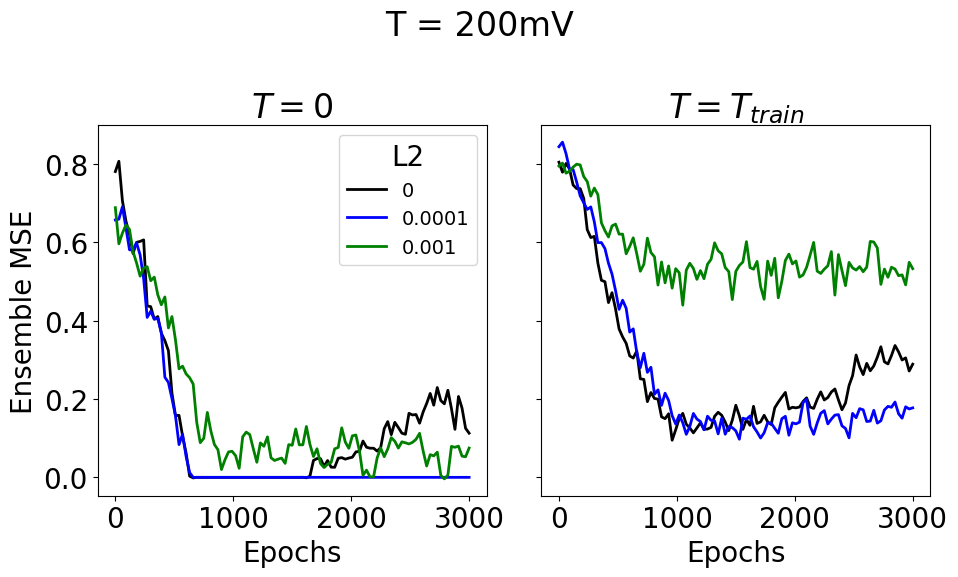

In [167]:
lam=300

colors = ['k', 'b', 'g']

epochs = np.array(df.epoch)

b = 12
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,6), sharey=True)
ax2.sharey(ax1)
for i, tdict in enumerate(tdicts):
    print(tdict['temp'])
    mses = tdict['MSEs']
    dmses = tdict['dMSEs']
    mse = np.mean(mses, axis=0)
    dmse = np.mean(dmses, axis=0)
    spl = make_smoothing_spline(epochs, mse, lam=lam)
    ax2.plot(epochs, spl(epochs), label = tdict['L2'],  linewidth=2, color=colors[i])
    dspl = make_smoothing_spline(epochs, dmse, lam=lam)
    ax1.plot(epochs, dspl(epochs), label = tdict['L2'], linewidth=2, color=colors[i])

ax1.legend(title = 'L2', fontsize=14)
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Ensemble MSE')
# ax1.set_xlim(-100, 1500)
ax2.set_xlabel('Epochs')
# ax2.set_xlim(-100, 1500)

# ax1.set_ylim(-0.05, 0.95)
ax1.set_title(r'$T=0$')
ax2.set_title(r'$T=T_{train}$')

fig.suptitle('T = {}mV'.format(temp))
fig.tight_layout()
# fig.savefig('figures/ensemble_error_200mV_L2s.png')

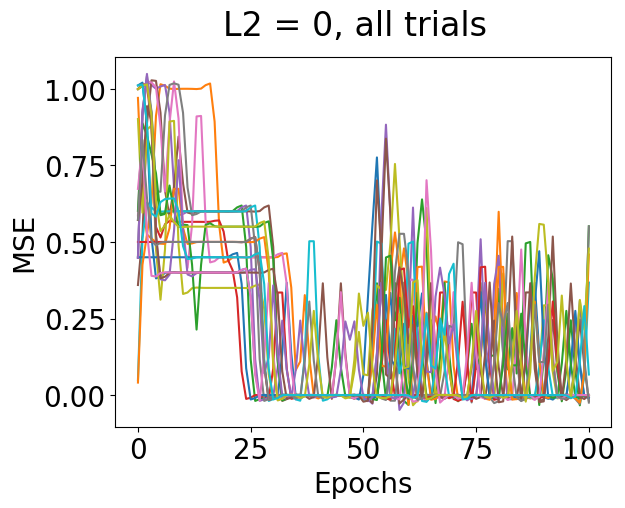

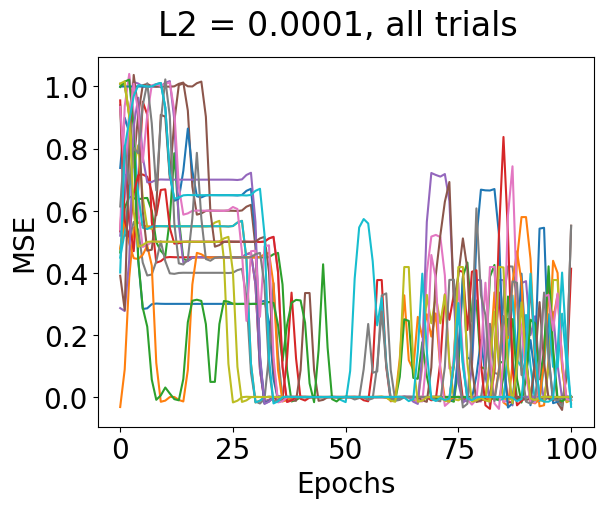

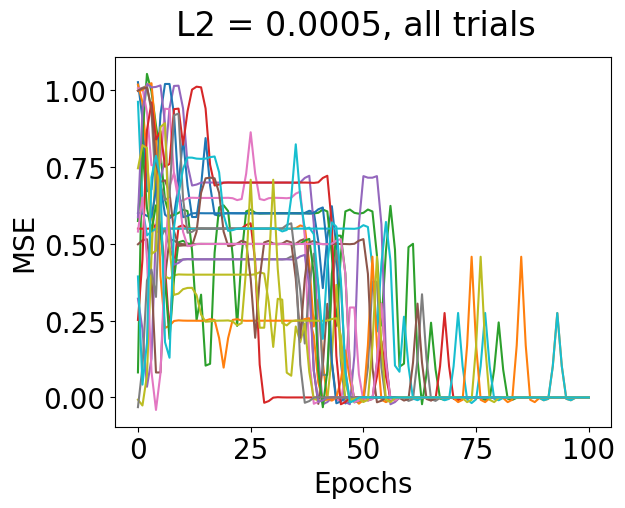

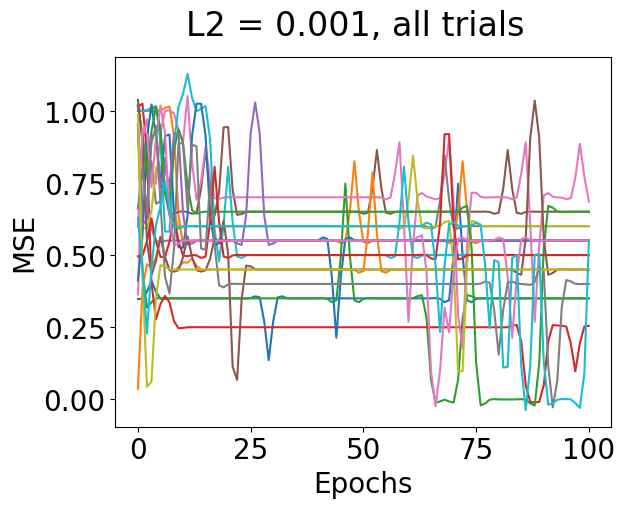

In [162]:
lam=.1
for i, tdict in enumerate(tdicts):
    # print(tdict['temp'])
    fig, ax = plt.subplots()
    title = 'L2 = {}, all trials'.format(tdict['L2'])
    fig.suptitle(title)
    for mse in tdict['dMSEs']:
    #print(mse)
        epochs = np.arange(len(mse))
        spl = make_smoothing_spline(epochs, mse, lam=lam)
        # ax.scatter(epochs, mse)
        ax.plot(epochs, spl(epochs), label = tdict['temp'])
    ax.set_ylabel('MSE')
    ax.set_xlabel('Epochs')
    plt.show()

Text(0, 0.5, 'Ensemble Edge k St.Dev.')

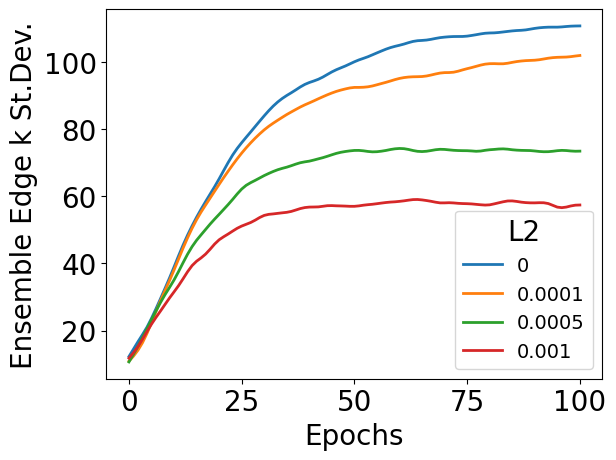

In [156]:
lam=1

fig, ax = plt.subplots()

for i, tdict in enumerate(tdicts):
    L2 = tdict['L2']

    est = []
    for i, fconfig in enumerate(tdict['fconfigs']):
        estd = []
        for e in range(len(epochs)):
            elist = []
            for key in fconfig.keys():
                elist.append(fconfig[key][e])
            estd.append(np.std(elist))
        est.append(np.array(estd))

    est = np.array(est)
    mestd = np.mean(est, axis=0)
    spl = make_smoothing_spline(epochs, mestd, lam=lam)
    ax.plot(epochs, spl(epochs), label = L2,  linewidth=2)
ax.legend(title='L2', fontsize=14)
ax.set_xlabel('Epochs')
ax.set_ylabel('Ensemble Edge k St.Dev.')

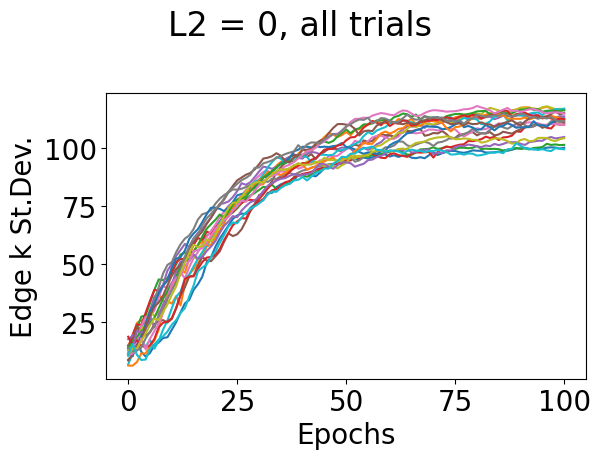

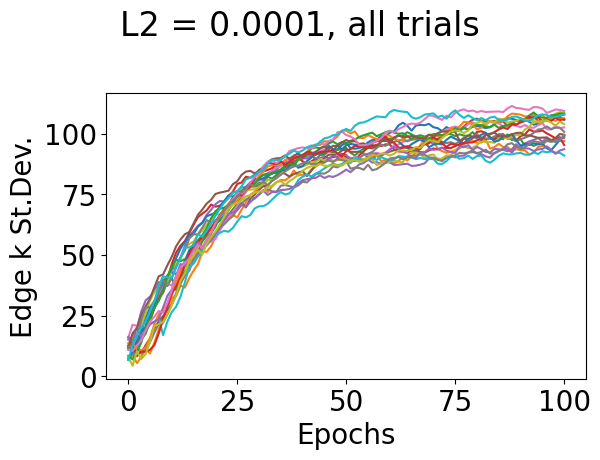

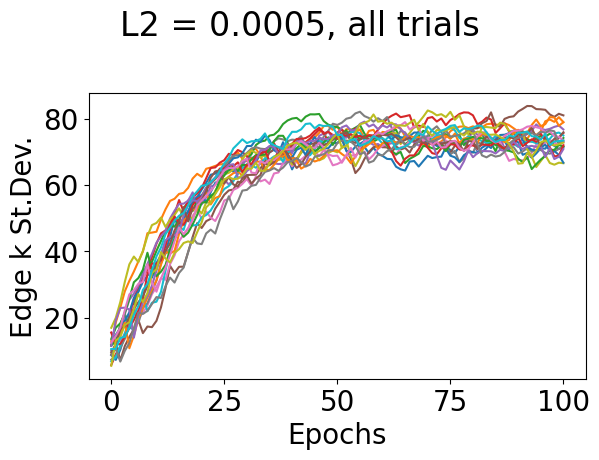

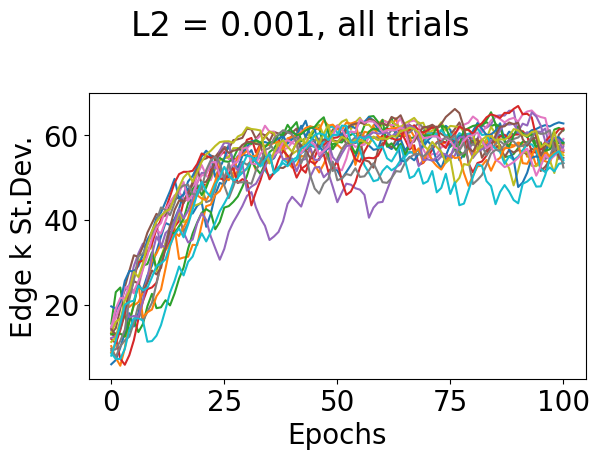

In [157]:
lam=1
for i, tdict in enumerate(tdicts):
    # print(tdict['temp'])
    title = 'L2 = {}, all trials'.format(tdict['L2'])
    fig, ax = plt.subplots()
    fig.suptitle(title)

    for i, fconfig in enumerate(tdict['fconfigs']):
        estd = []
        for e in range(len(epochs)):
            elist = []
            for key in fconfig.keys():
                elist.append(fconfig[key][e])
            estd.append(np.std(elist))

        ax.plot(epochs, estd)
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Edge k St.Dev.')
    fig.tight_layout()
    plt.show()

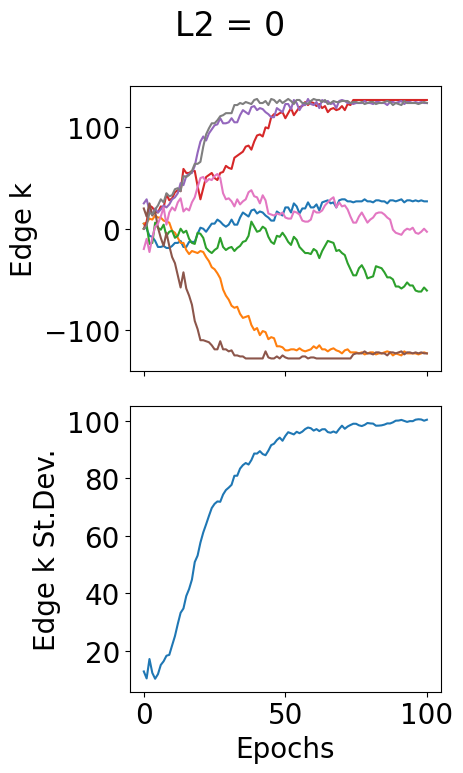

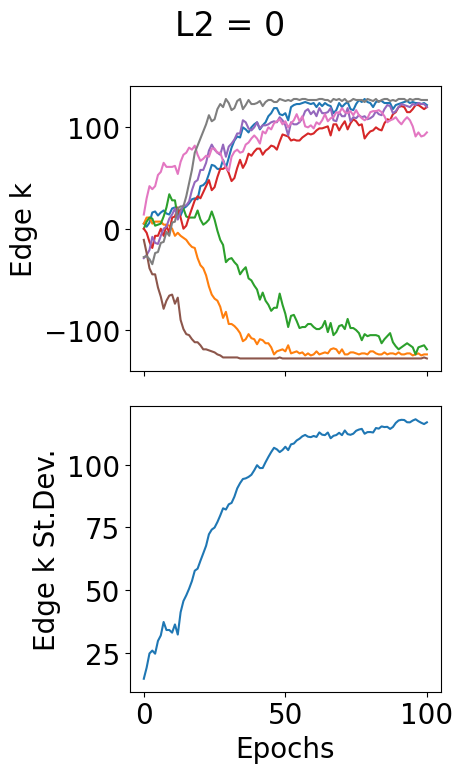

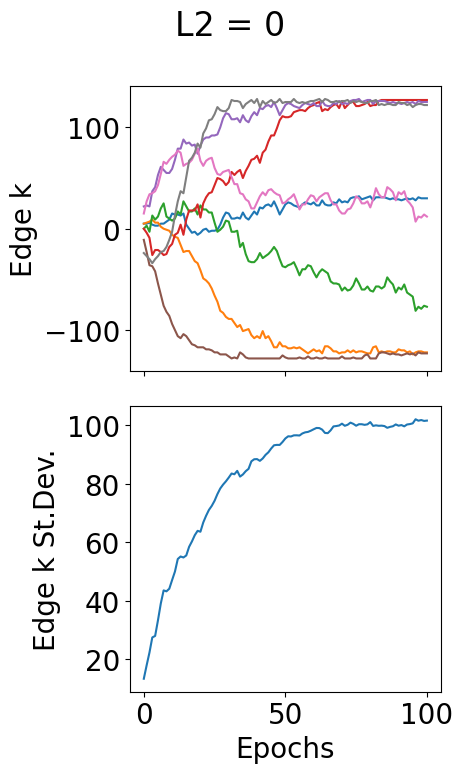

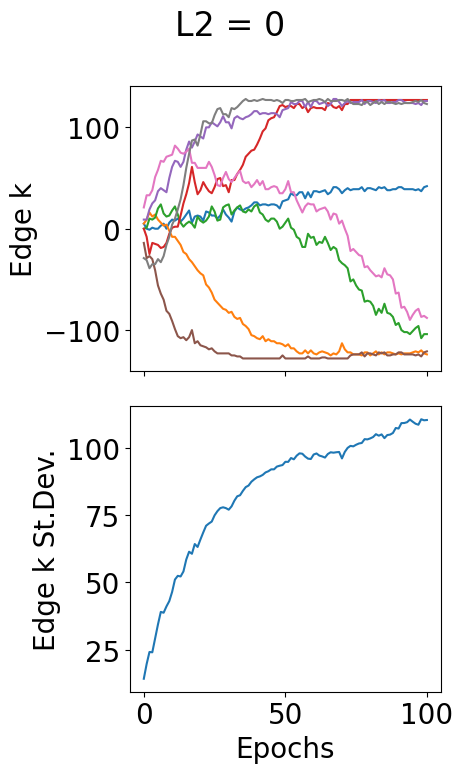

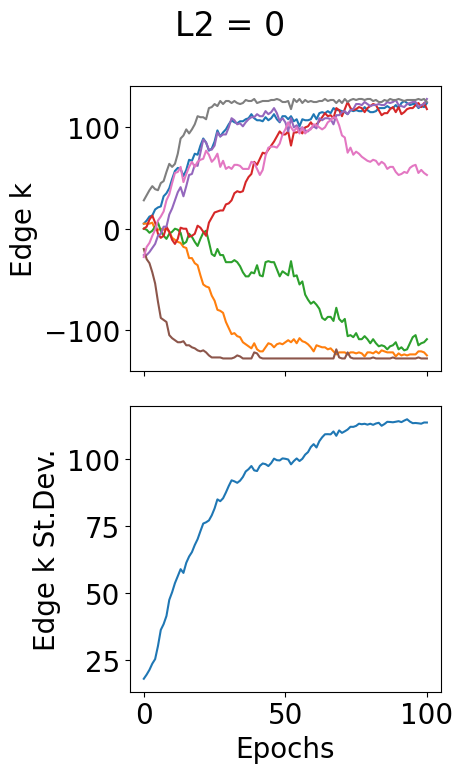

...

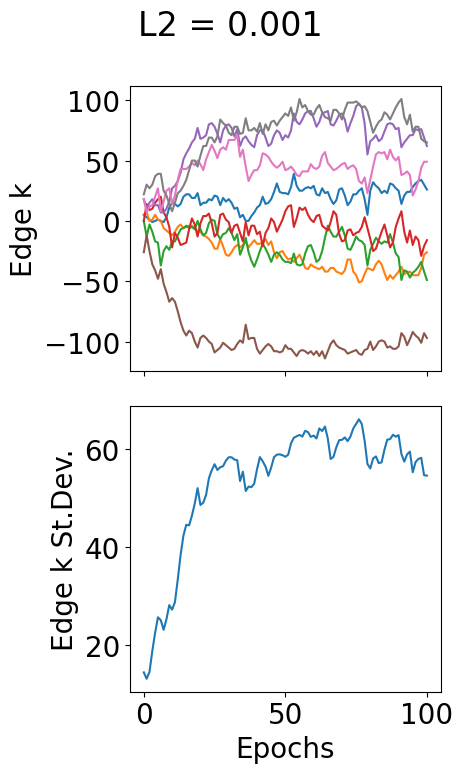

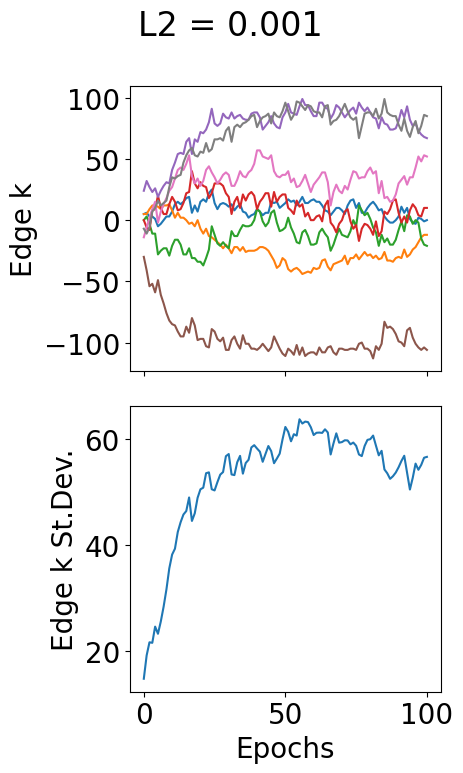

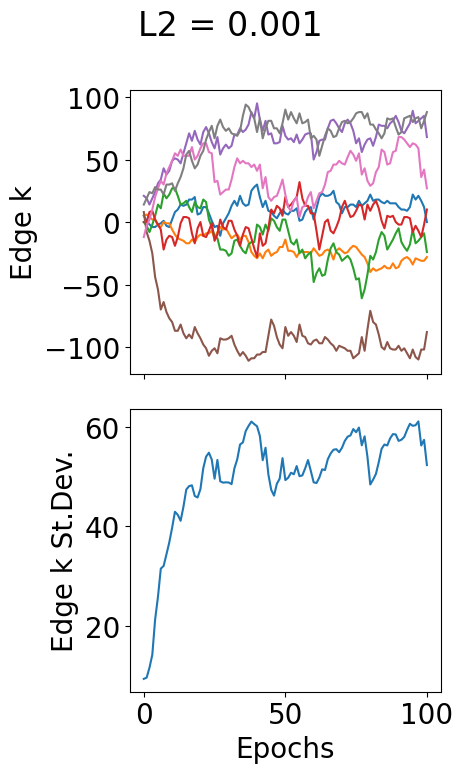

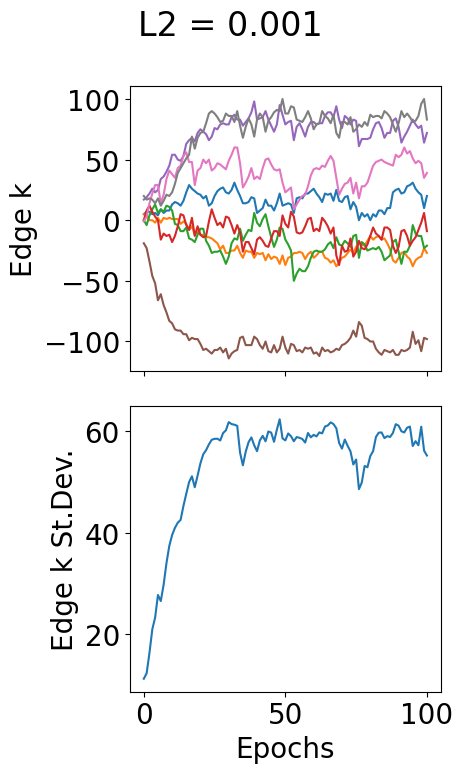

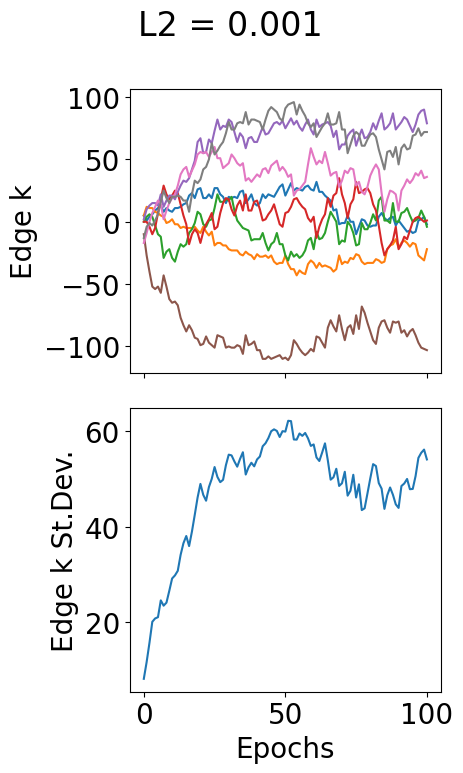

In [158]:
lam=1
for i, tdict in enumerate(tdicts):
    # print(tdict['temp'])
    title = 'L2 = {}'.format(tdict['L2'])

    for i, fconfig in enumerate(tdict['fconfigs']):
        fig, (ax1, ax2) = plt.subplots(2,1, figsize=(5,8), sharex=True)
        fig.suptitle(title)
        ax.set_title('Trial {}'.format(i))
        for key in fconfig.keys():
            ax1.plot(epochs, fconfig[key], label=key)

        estd = []
        for e in range(len(epochs)):
            elist = []
            for key in fconfig.keys():
                elist.append(fconfig[key][e])
            estd.append(np.std(elist))

        ax1.set_ylabel('Edge k')
        ax2.set_xlabel('Epochs')
        ax2.set_ylabel('Edge k St.Dev.')
        ax2.plot(epochs, estd)
        fig.tight_layout()
        plt.show()

10


C:\Users\FoamPerson\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\networkx\drawing\nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


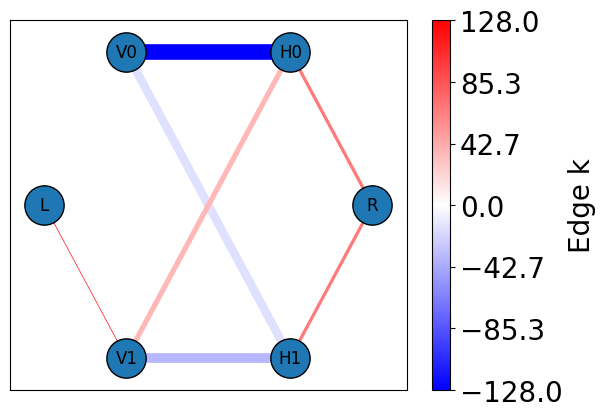

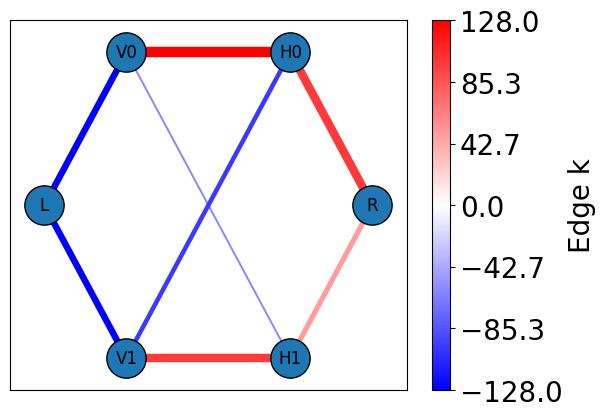

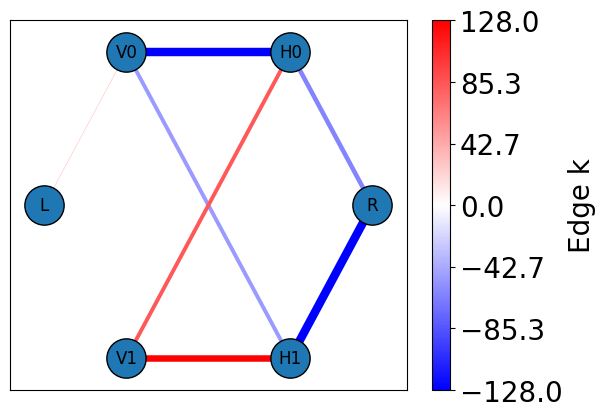

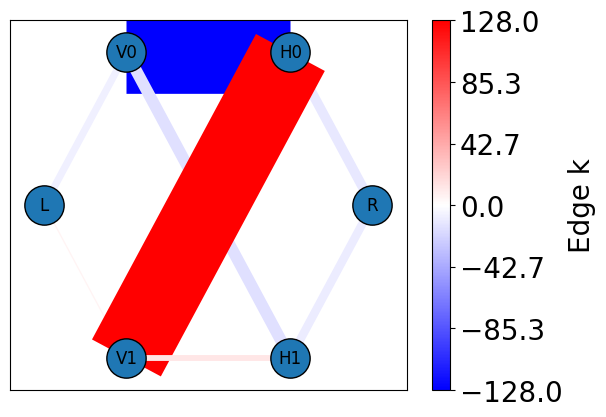

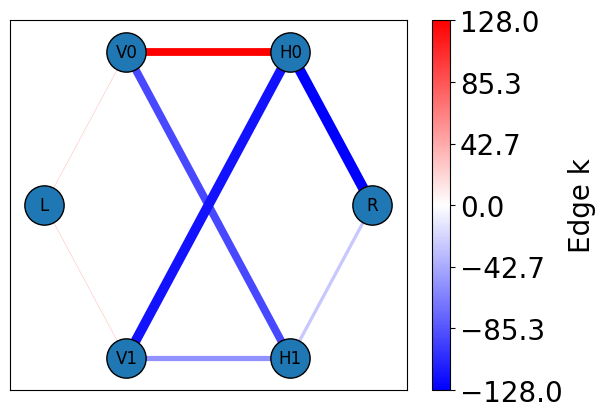

...

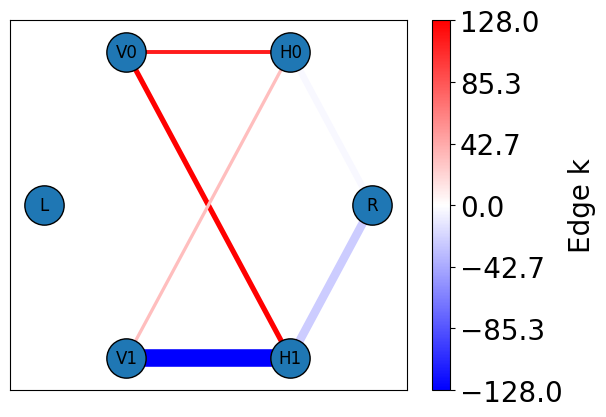

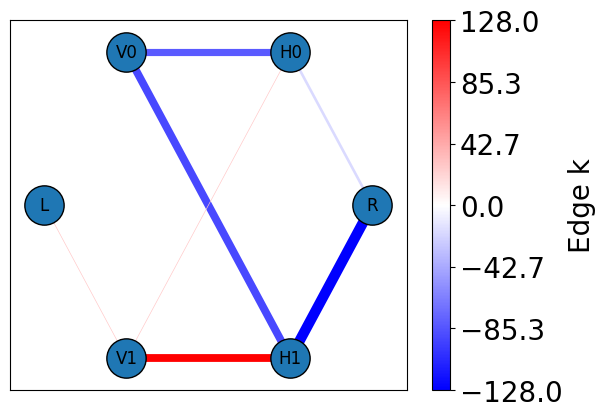

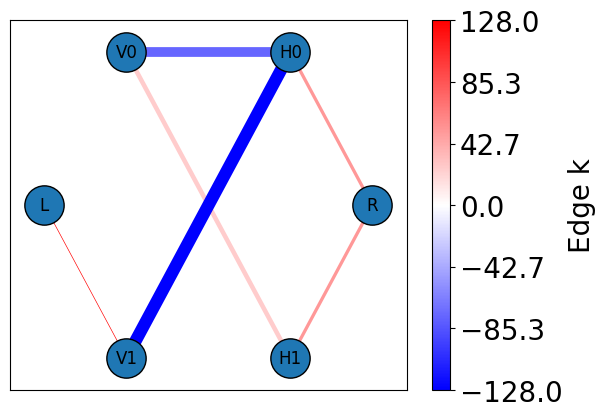

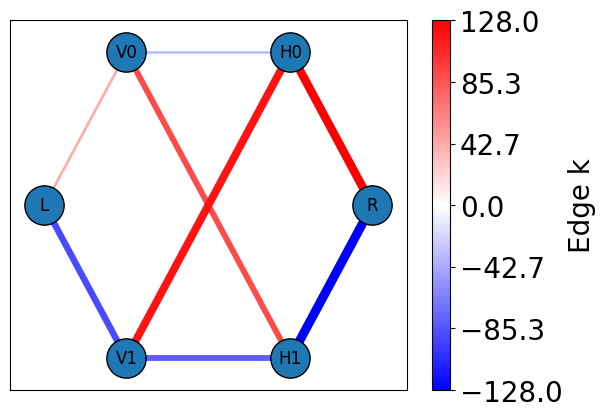

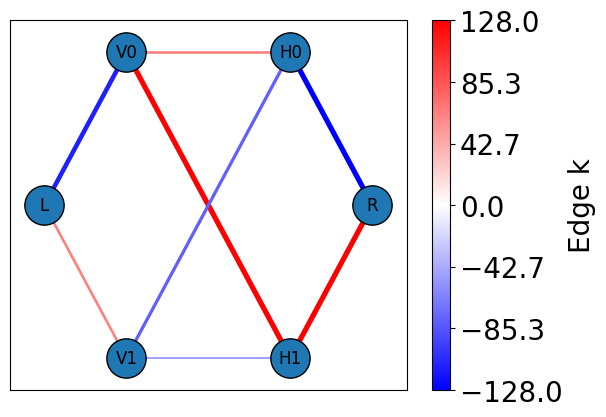

20


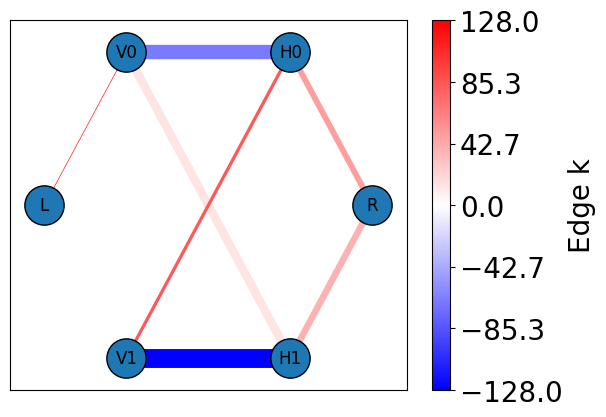

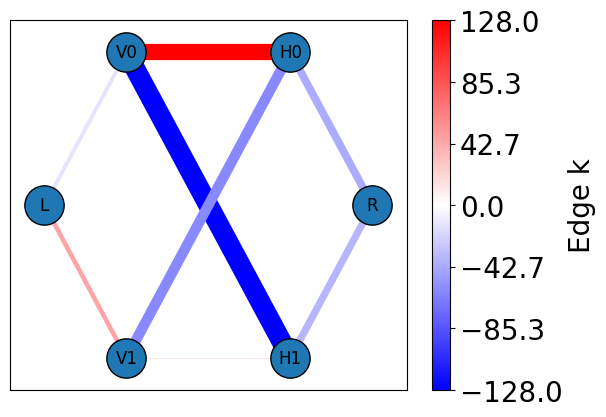

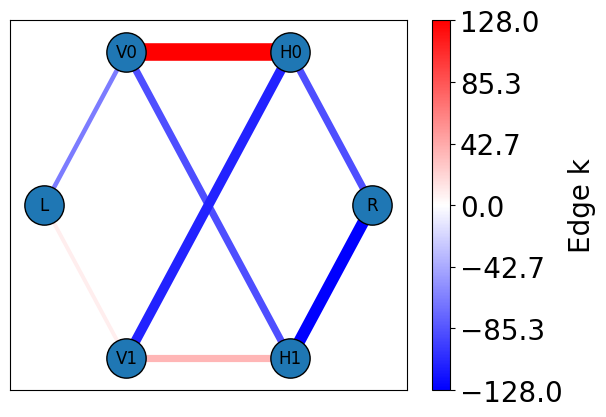

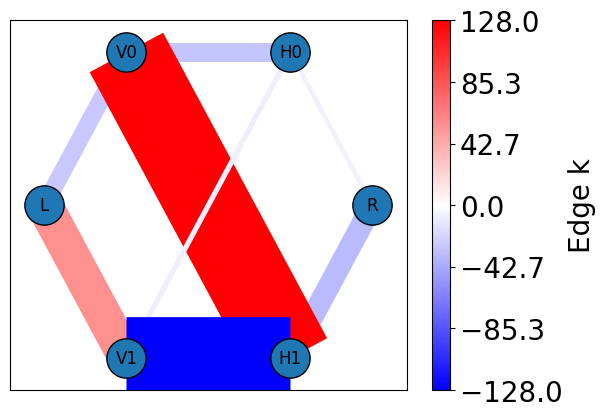

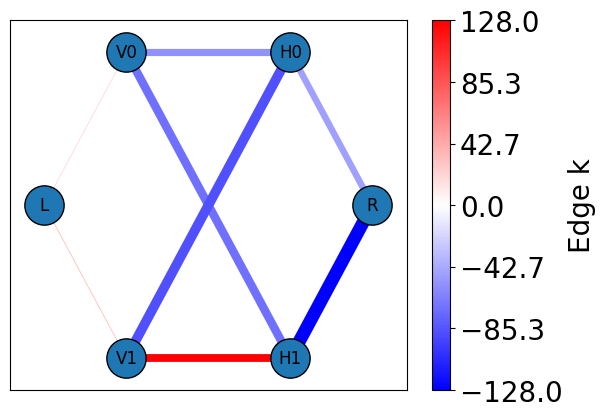

...

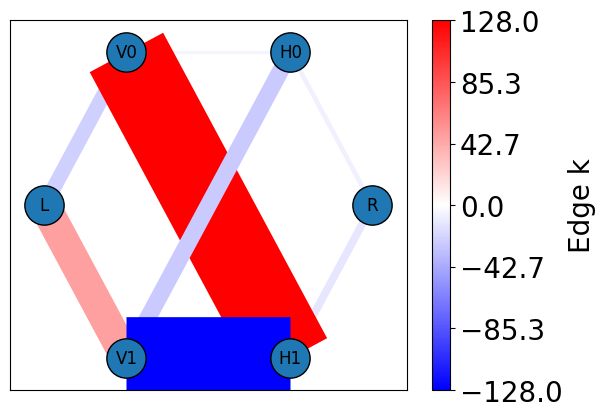

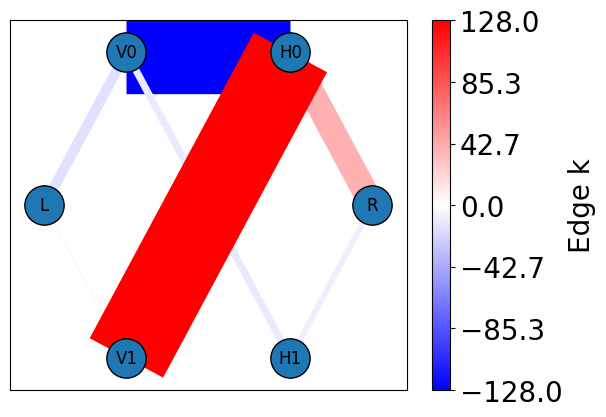

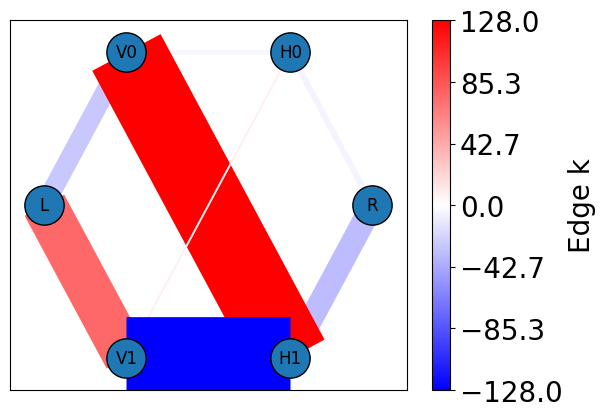

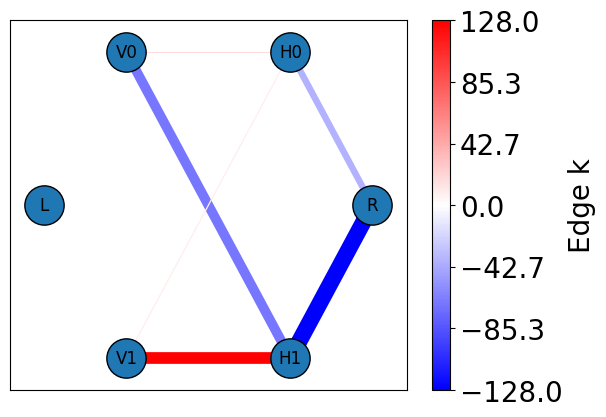

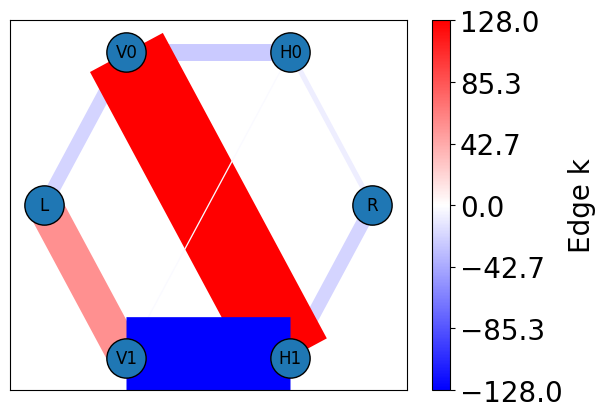

50


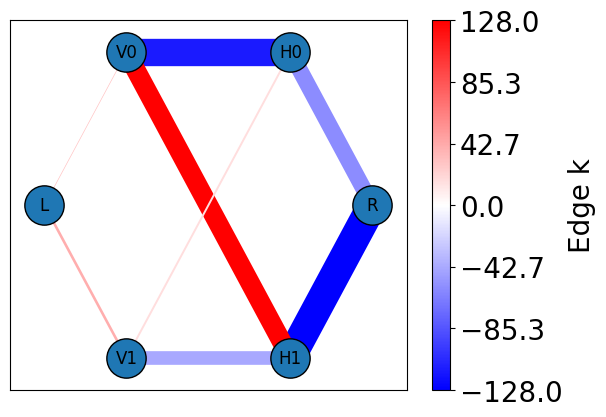

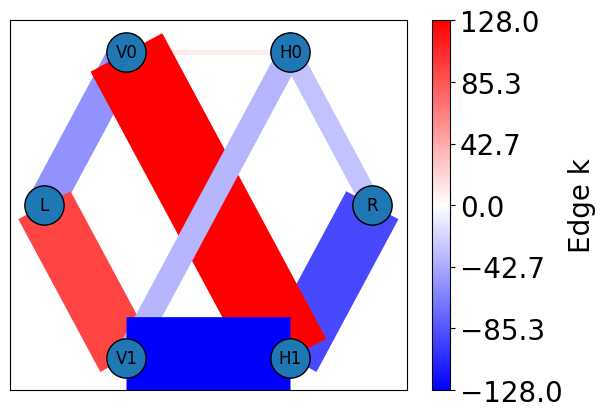

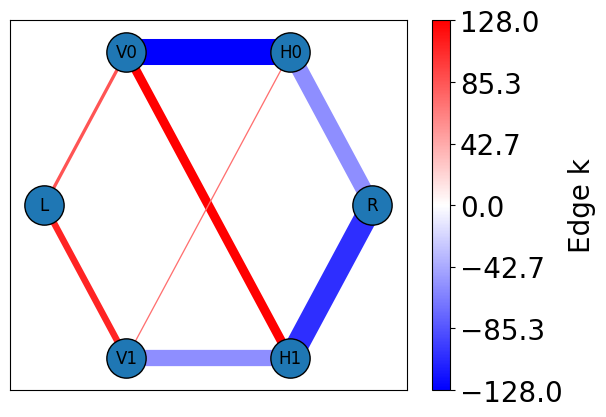

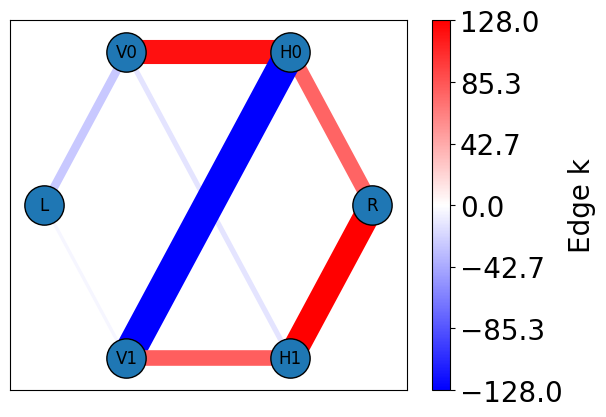

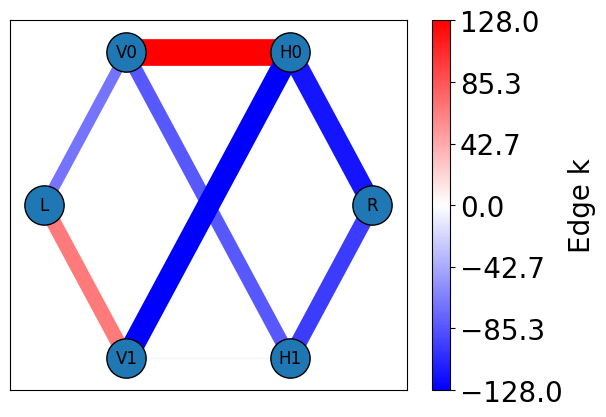

...

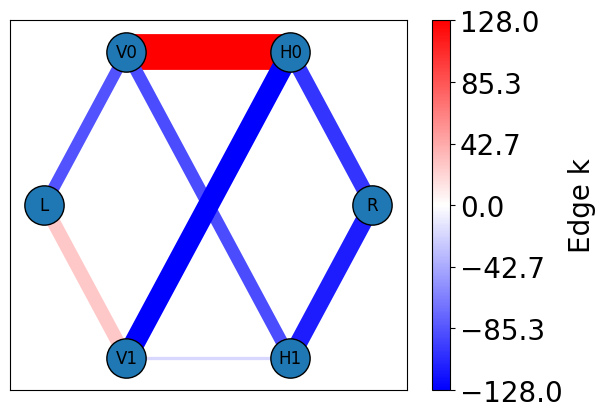

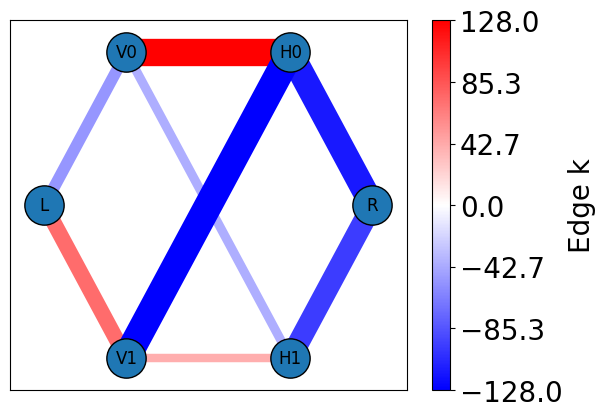

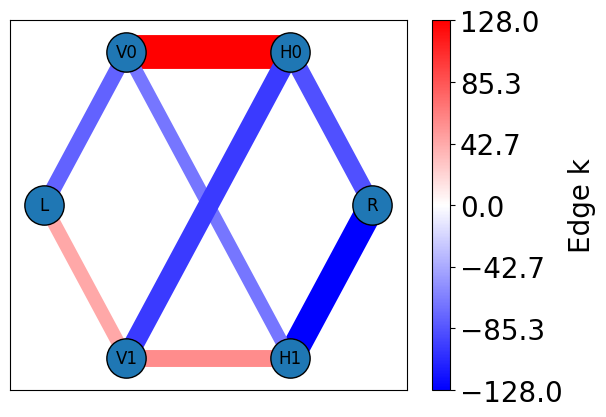

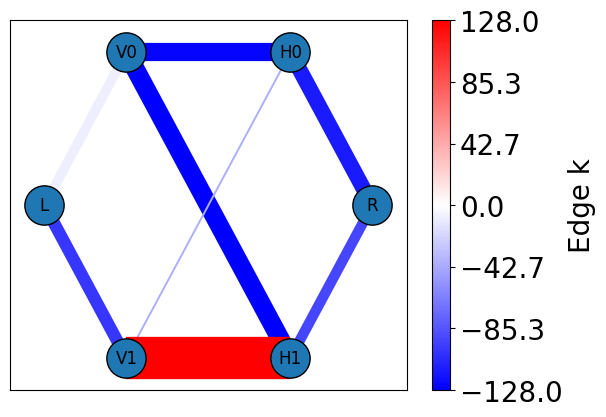

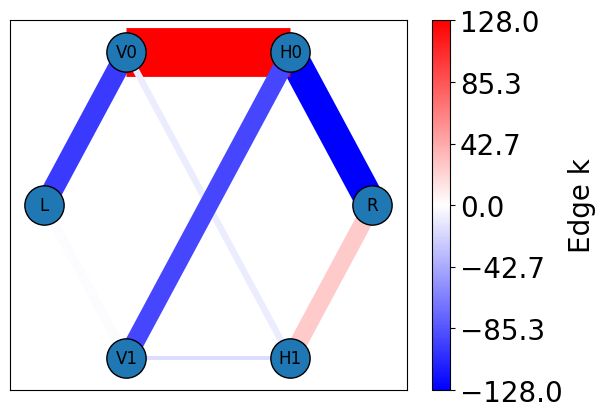

100


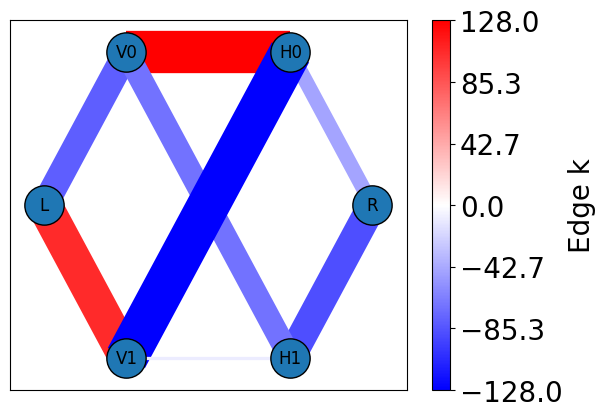

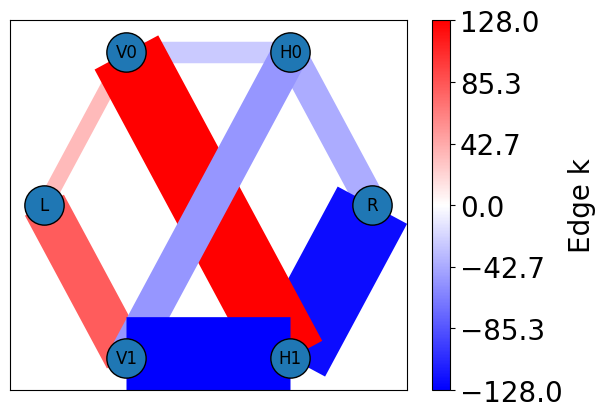

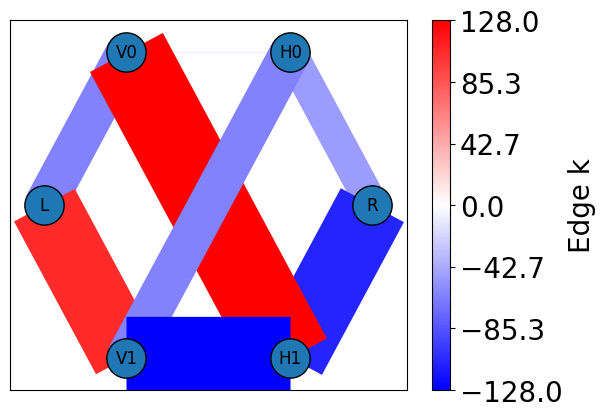

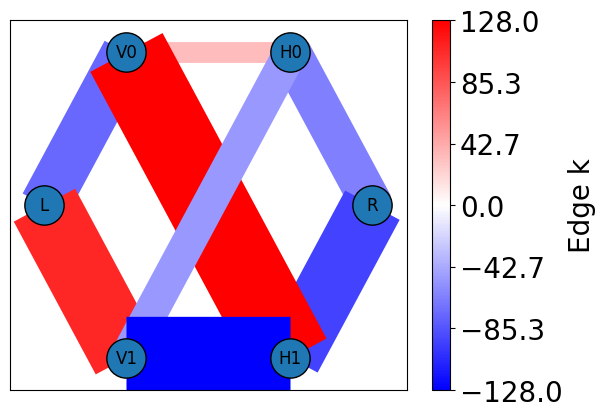

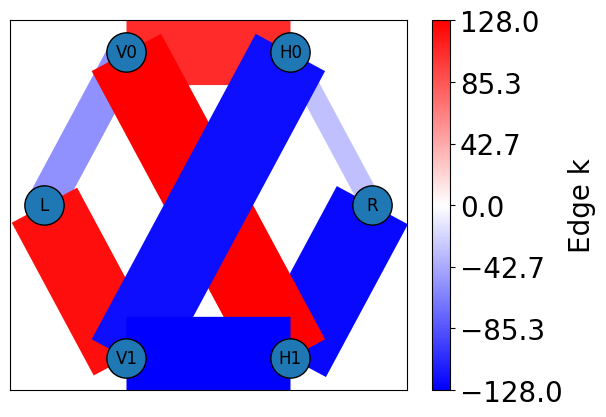

...

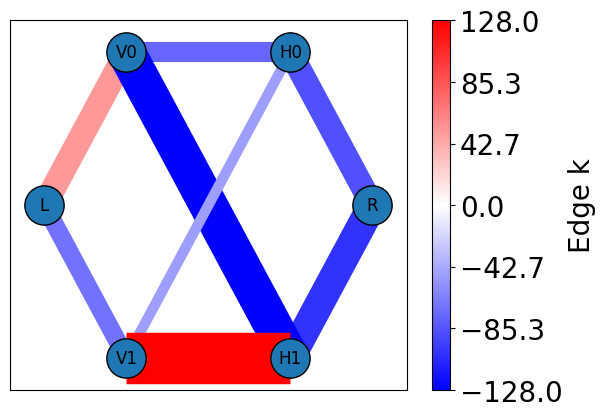

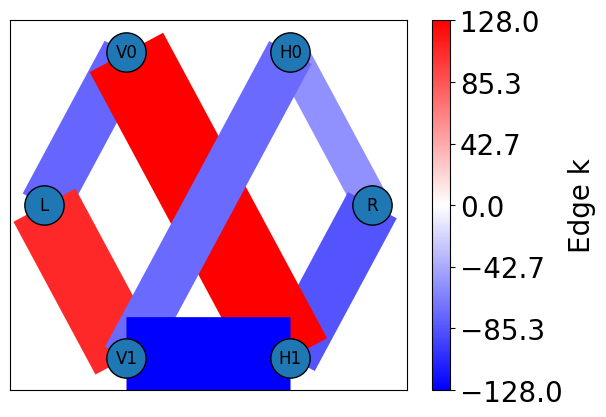

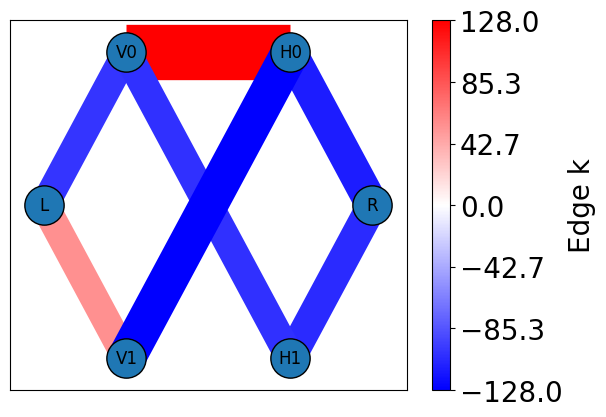

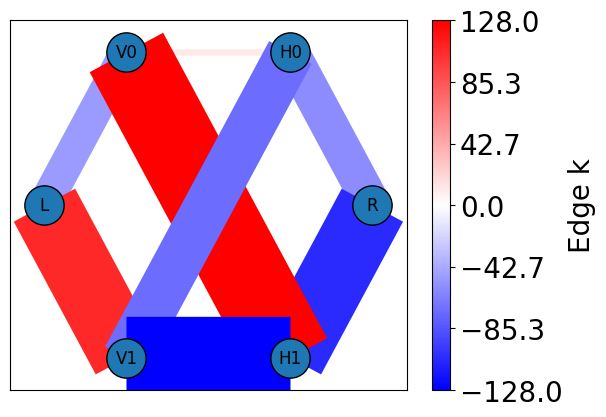

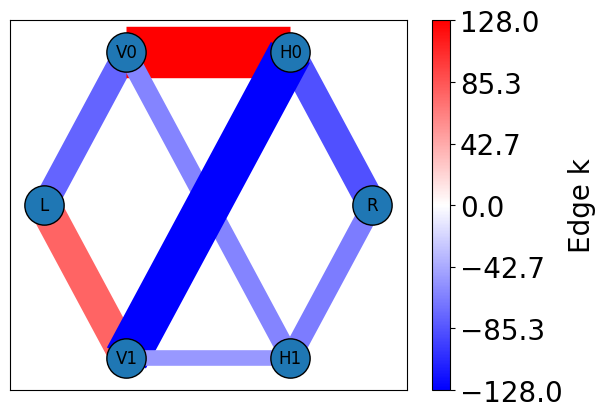

200


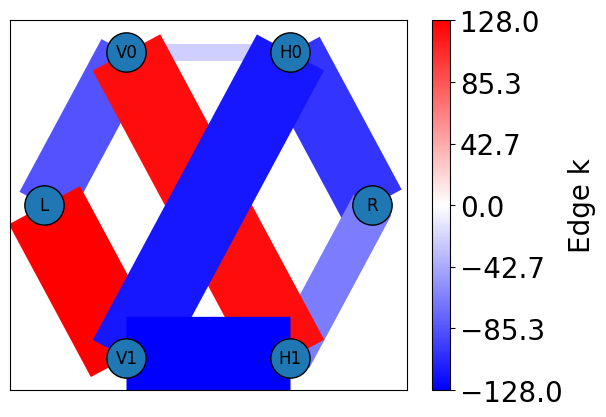

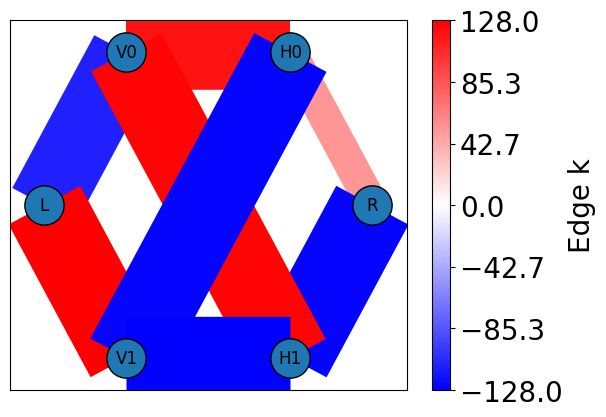

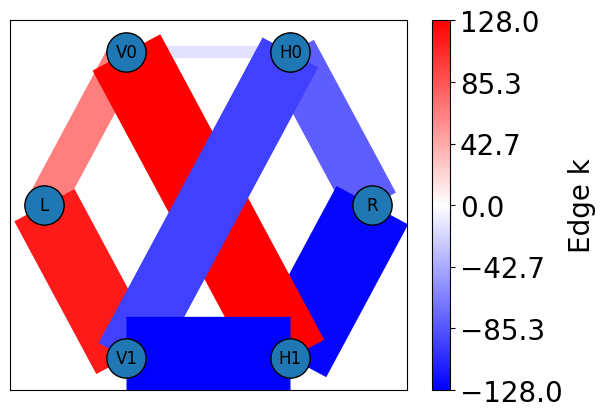

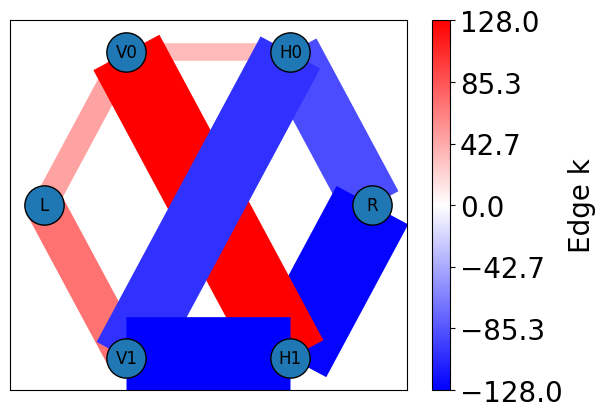

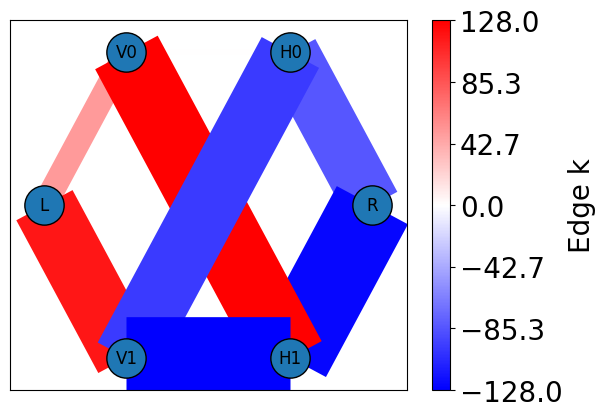

...

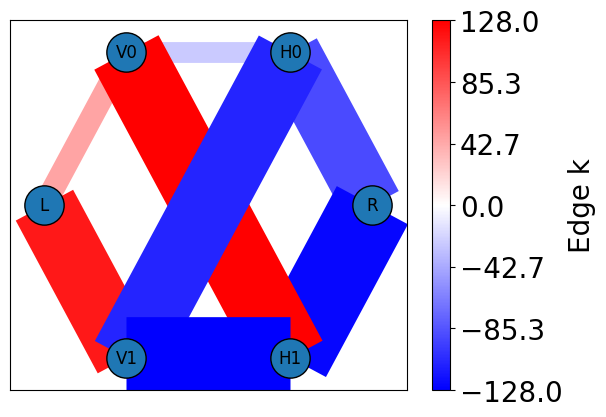

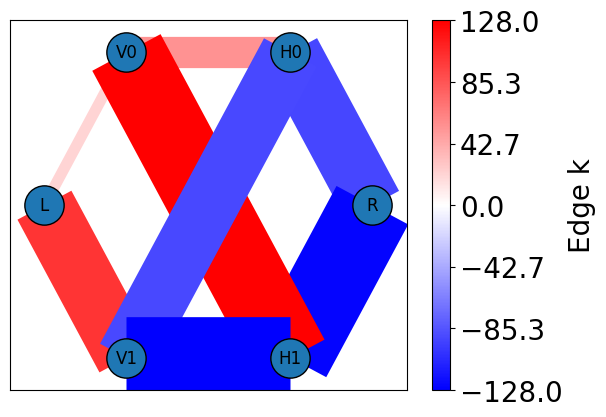

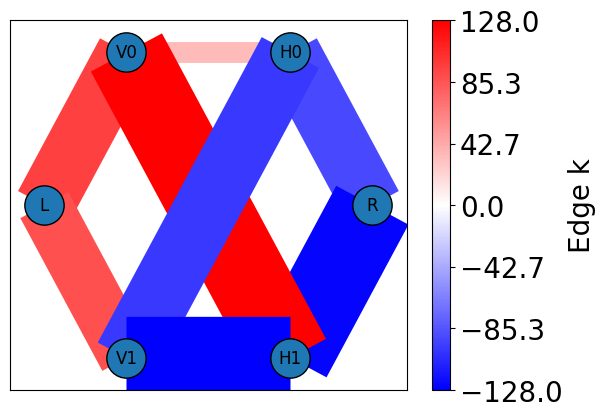

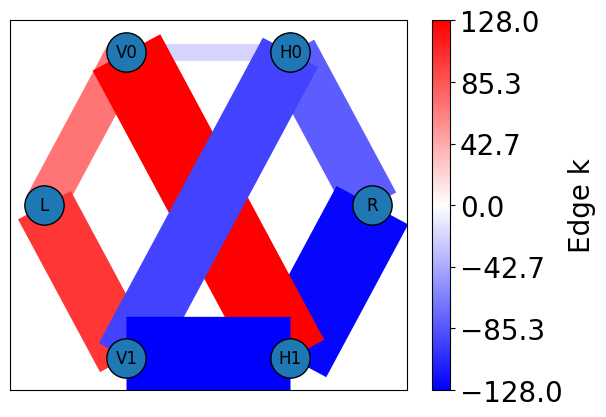

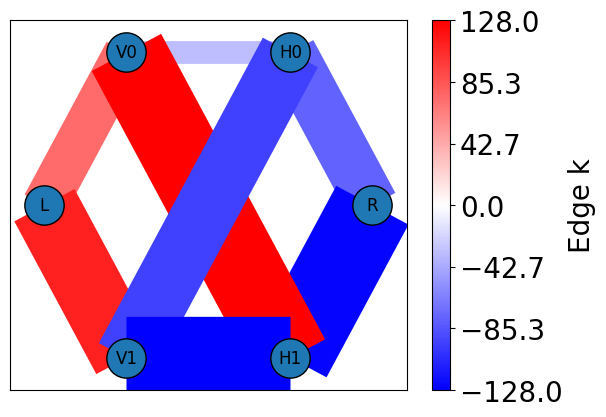

500


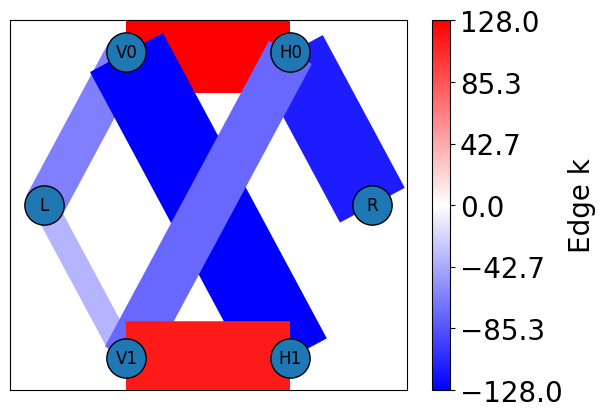

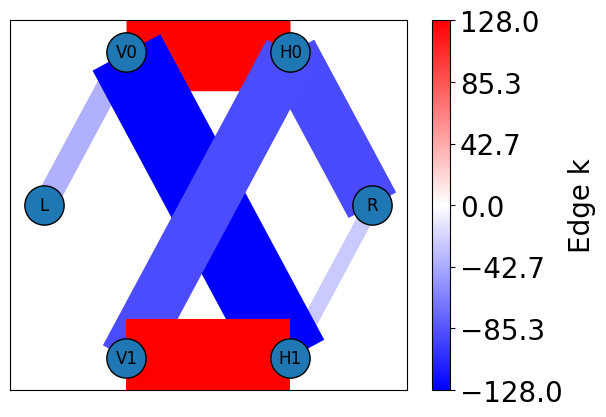

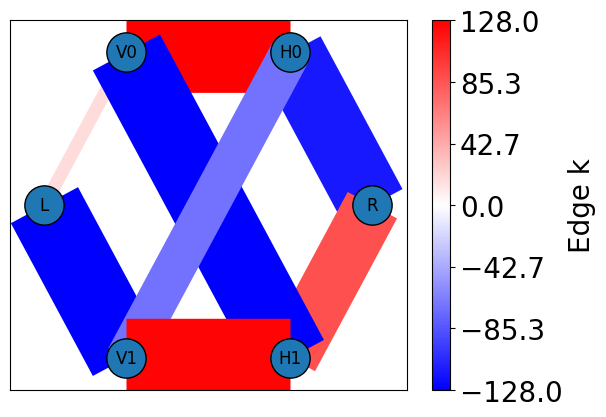

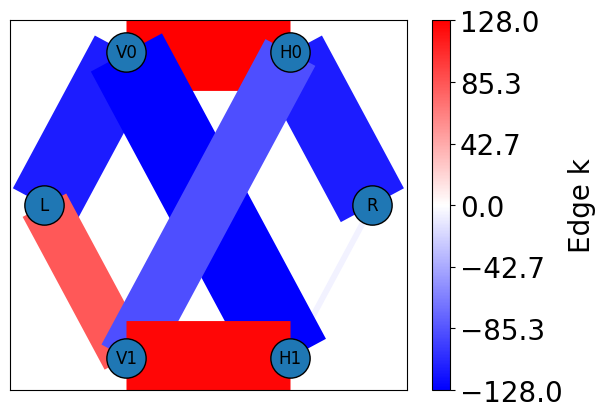

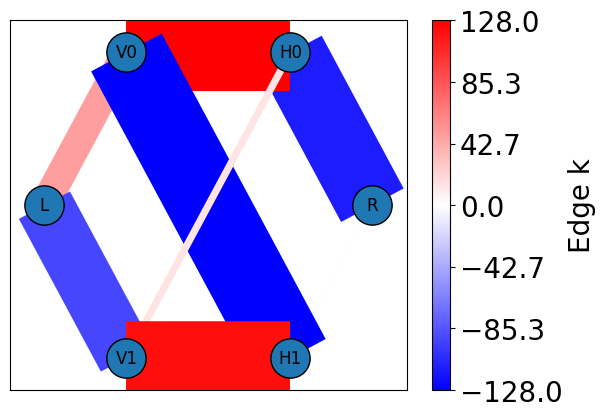

...

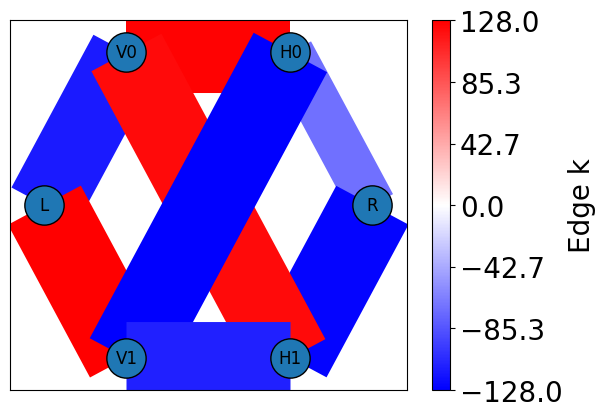

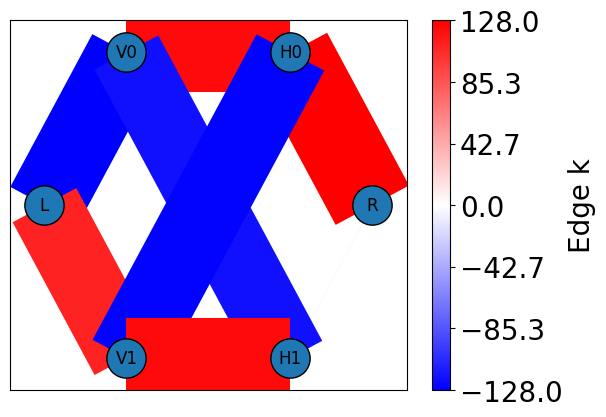

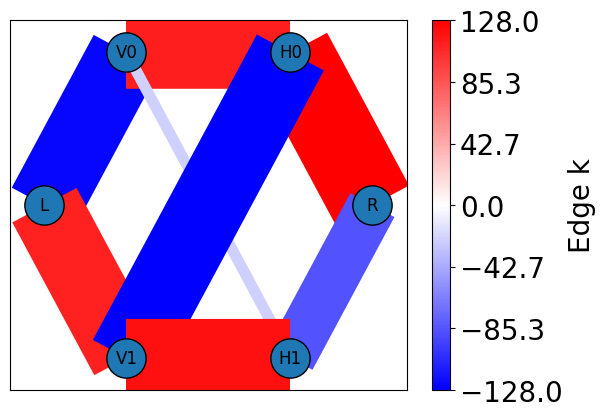

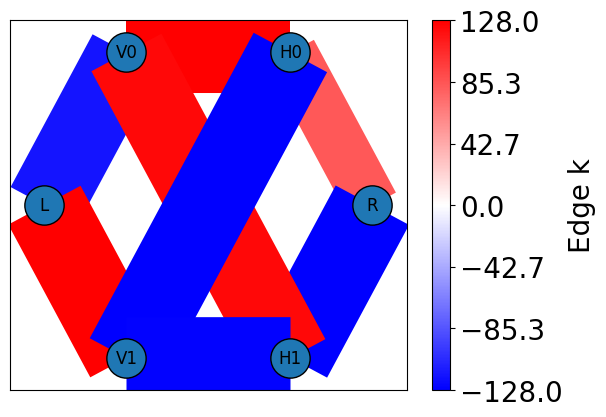

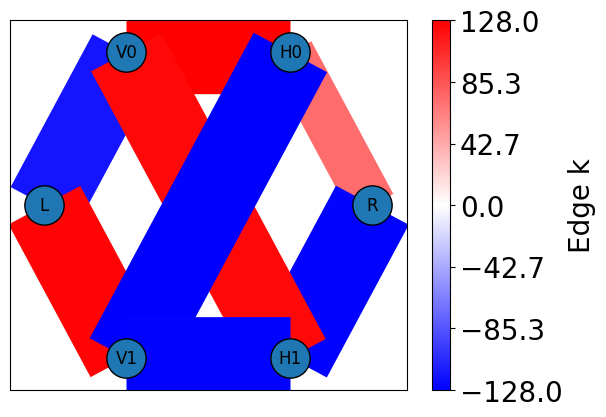

In [11]:
numV = 2
numH = 2

net = RKMNetwork(numV,numH)

for tdict in tdicts:
    print(tdict['temp'])
    configs = pd.DataFrame(tdict['fconfigs'])
    for i, row in configs.iterrows():
        net.load_state(row)
        net.draw_network_state()
        plt.show()

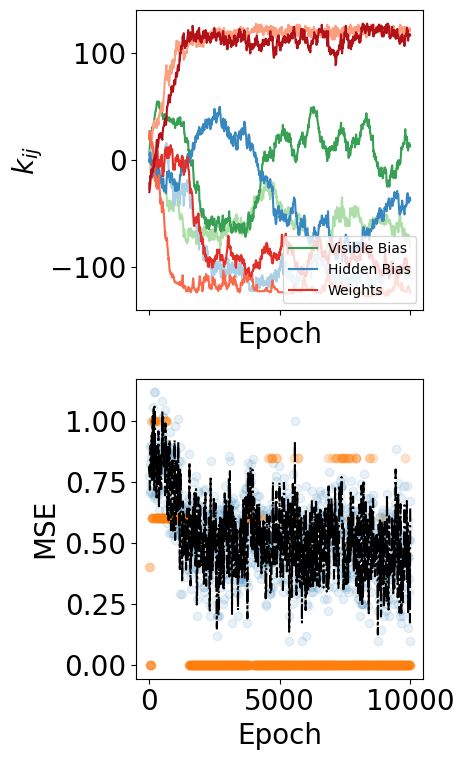

In [25]:
# 18
df = pd.read_csv('data/trainings/T_500mV_L2_0_detinf/train10.csv')
setup(df)
# df
fig= plot_training(df)
#fig.savefig('figures/50mV_demo.png')

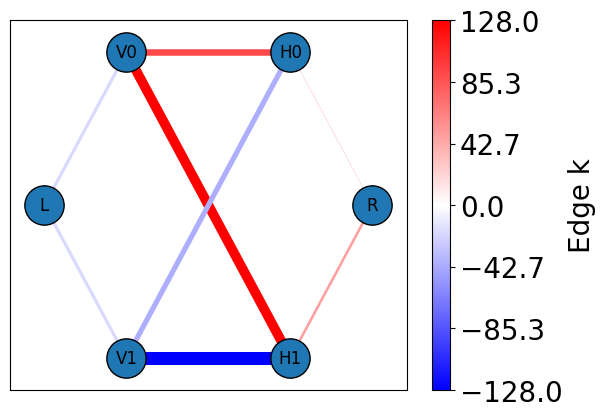

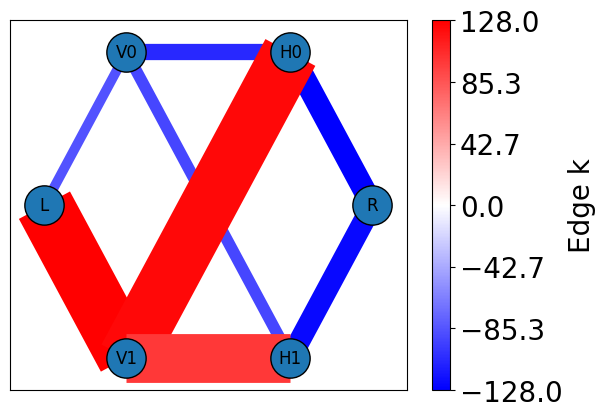

In [121]:
numV = 2
numH = 2

net = RKMNetwork(numV,numH)

row = df.iloc[0]

net.load_state(row)

net.draw_network_state()

row = df.iloc[-1]
# print(row)
net.load_state(row)
net.draw_network_state()

#net.draw_fullnetwork_state()
net

Text(0, 0.9, 'Epoch = 999')

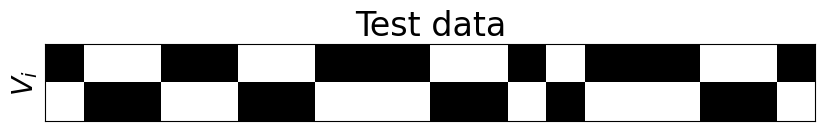

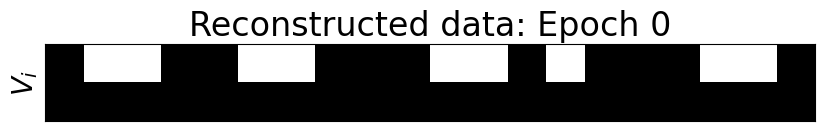

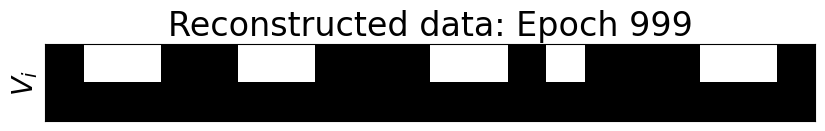

In [179]:
step = -1

last = df.iloc[-1].trainingstep

row = df[df.trainingstep == step].iloc[0]


Vtest = np.array(row.Vtest_det).T
Vrecon0 = np.array(row.Vrecon_det).T

step2 = last

row = df[df.trainingstep == step2].iloc[0]



Vrecon2 = np.array(row.Vrecon_det).T

# fig, (ax1, ax2, ax3) = plt.subplots(3,1, sharex=True, figsize=(10,3))
fig1, ax1 = plt.subplots(figsize=(10,1))
fig2, ax2 = plt.subplots(figsize=(10,1))
fig3, ax3 = plt.subplots(figsize=(10,1))

ax1.imshow(Vtest, cmap='binary')
ax2.imshow(Vrecon0, cmap='binary')
ax3.imshow(Vrecon2, cmap='binary')

ax1.set_xticks([])
ax2.set_xticks([])
ax3.set_xticks([])

ax1.set_yticks([])
ax2.set_yticks([])
ax3.set_yticks([])

ax1.set_ylabel(r'$V_i$')
ax2.set_ylabel(r'$V_i$')
ax3.set_ylabel(r'$V_i$')

ax1.set_title("Test data")

ax2.set_title("Reconstructed data: Epoch 0")
ax3.set_title("Reconstructed data: Epoch {}".format(step2))
fig.text(0,0.9,"Epoch = {}".format(row.epoch))
# fig1.tight_layout()
# fig2.tight_layout()
# fig3.tight_layout()

# fig1.savefig('figures/test_data_0728.png')
# fig2.savefig('figures/recon_data_0_0728.png')
# fig3.savefig('figures/recon_data_198_0728.png')

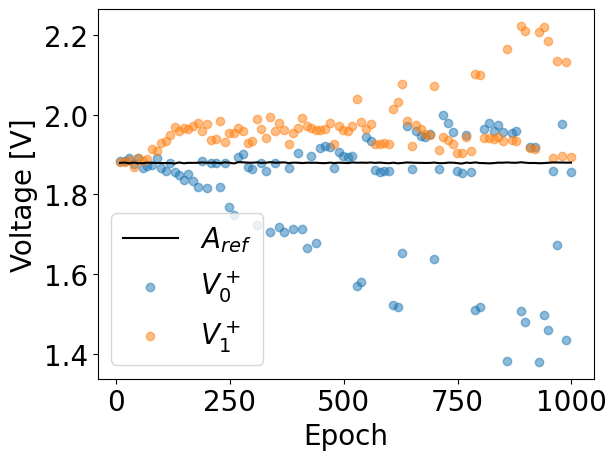

In [180]:
plt.plot(df.trainingstep, df.analogZero, c='k', zorder=5, label=r'$A_{ref}$')
#plt.hlines(np.mean(df.analogZero)+.1, 0, np.max(df.trainingstep))
plt.scatter(df.trainingstep, df.aV0, alpha=0.5, label=r'$V_0^+$')
plt.scatter(df.trainingstep, df.aV1, alpha=0.5, label=r'$V_1^+$')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Voltage [V]')
plt.show()

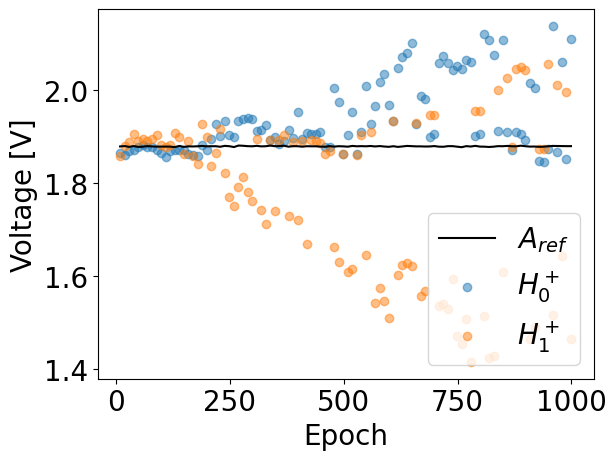

In [181]:
plt.plot(df.trainingstep, df.analogZero, c='k', zorder=5, label=r'$A_{ref}$')
plt.scatter(df.trainingstep, df.aH0, alpha=0.5, label=r'$H_0^+$')
plt.scatter(df.trainingstep, df.aH1, alpha=0.5, label=r'$H_1^+$')
plt.legend(loc='lower right')
plt.xlabel('Epoch')
plt.ylabel('Voltage [V]')
plt.show()